# Introduction 

Microplastics, defined as plastic particles smaller than 5 mm, are a growing concern in environmental and public health research. Despite their prevalence in ecosystems—especially marine environments—microplastics remain understudied, and their impacts on human health, marine life, and planetary ecosystems are not yet fully understood. In this context, the NOAA NCEI marine microplastics database offers a valuable but complex resource for studying these particles.

The database, described in [Nature Scientific Data](https://www.nature.com/articles/s41597-023-02632-y), aggregates several distinct datasets related to marine microplastics. While efforts have been made to standardise, integrate, and harmonise these datasets, significant variability remains due to differing sampling methods and inconsistencies across datasets. For instance, specific fields, such as "Density Class," are not comparable across different sampling approaches. These methodological inconsistencies present challenges when attempting to analyze the database as a whole or draw robust conclusions about sampling methods or predictive factors.

Although the database developers have applied rigorous criteria to determine what is included, the individual datasets comprising the database are not publicly accessible. This lack of access limits transparency and the ability to inspect individual datasets or their sampling methods in more depth. 

This project aims to conduct an exploratory critical analysis of the NOAA NCEI marine microplastics database. Specifically, we ask: Does the database contain adequate data to enable a meaningful global evaluation of microplastics in terms of distribution, concentration, and impact?



### Dataset Overview:

**Oceans:** Name of the ocean where the sample was collected.

**Regions:** Specific region within the ocean.

**SubRegions:** Subregion within the region.

**Sampling Method:** Method used to collect the sample.

**Measurement:** Microplastic density measurement (pieces/m3).

**Unit:** Unit of the measurement.

**Density Range:** Range of the density measurement.

**Density Class:** Classification of the density (e.g., Very Low, Low, Medium, High, Very High).

**Organisation:** Organisation responsible for the data collection.

**Accession Link:** Link to the data record.

**Latitude:** Latitude of the sample location.

**Longitude:** Longitude of the sample location.

**Date:** Date when the sample was collected. 

**x:** X-coordinate of the sample location.

**y:** Y-coordinate of the sample location.

**Year:** Year in which the sample was collected. (Added by us within the notebook)

**Month:** Month in which the sample was collected. (Added by us within the notebook)

**Season:** Season in which the sample was collected. (Added by us within the notebook)

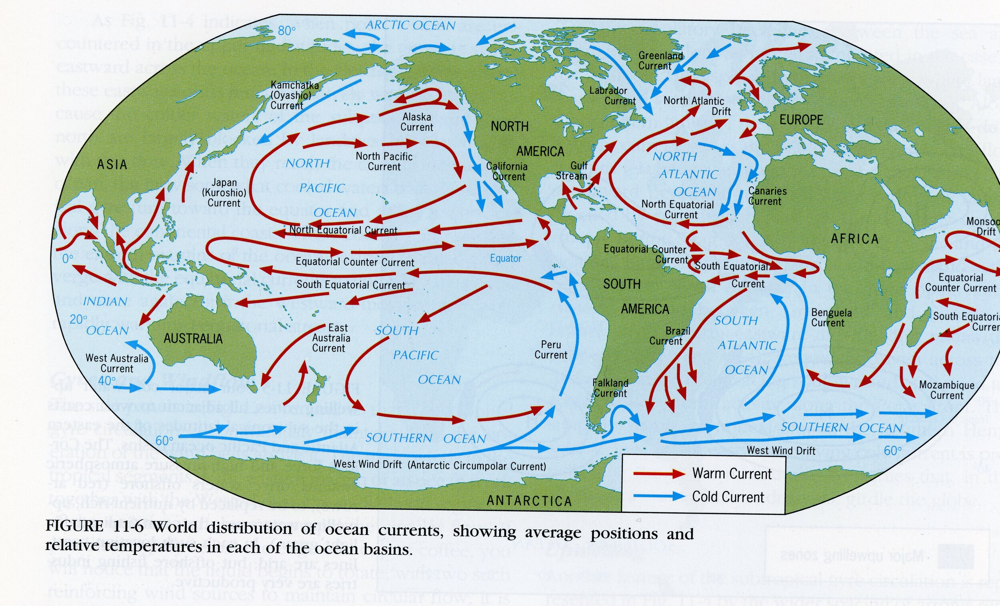

# Data Cleaning and Preparation

In [97]:
# importing all the necessary libraries

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import statsmodels.api as sm

In [98]:
# loading the data into the notebook

pd.set_option('display.max_columns', None)

microplastics = pd.read_csv('data/Marine_Microplastics_WGS84_5159774935198085819.csv')
microplastics.head()

,OBJECTID,Oceans,Regions,SubRegions,Sampling Method,Measurement,Unit,Density Range,Density Class,Short Reference,Long Reference,DOI,Organization,Keywords,Accession Number,Accession Link,Latitude,Longitude,Date,GlobalID,x,y
0,1,Atlantic Ocean,NaN,NaN,Neuston net,0.000000,pieces/m3,0-0.0005,Very Low,Law et al.2010,"Law, K.L., S. Morét-Ferguson, N.A. Maximenko, ...",https://doi.org/10.1126/science.1192321,Sea Education Association,SEA,211007,https://www.ncei.noaa.gov/access/metadata/land...,45.28,-60.29,7/13/1989 12:00:00 AM,88ccb360-a4b6-4dac-954e-4eb7d61ecab4,-60.29,45.28
1,2,Atlantic Ocean,NaN,NaN,Neuston net,0.002276,pieces/m3,0.0005-0.005,Low,Law et al.2010,"Law, K.L., S. Morét-Ferguson, N.A. Maximenko, ...",https://doi.org/10.1126/science.1192321,Sea Education Association,SEA,211007,https://www.ncei.noaa.gov/access/metadata/land...,40.93,-70.65,10/12/1989 12:00:00 AM,5a9c64f2-a6fb-40ed-a79a-f4bbb586d753,-70.65,40.93
2,3,Atlantic Ocean,NaN,NaN,Neuston net,0.004320,pieces/m3,0.0005-0.005,Low,Law et al.2010,"Law, K.L., S. Morét-Ferguson, N.A. Maximenko, ...",https://doi.org/10.1126/science.1192321,Sea Education Association,SEA,211007,https://www.ncei.noaa.gov/access/metadata/land...,40.93,-70.65,10/12/1989 12:00:00 AM,a09a6842-c66a-4718-9989-4907cd428f38,-70.65,40.93
3,4,Atlantic Ocean,NaN,NaN,Neuston net,0.000000,pieces/m3,0-0.0005,Very Low,Law et al.2010,"Law, K.L., S. Morét-Ferguson, N.A. Maximenko, ...",https://doi.org/10.1126/science.1192321,Sea Education Association,SEA,211007,https://www.ncei.noaa.gov/access/metadata/land...,40.30,-69.77,10/12/1989 12:00:00 AM,ce10e70e-5af9-4bb9-80ac-3467c3e90fba,-69.77,40.30
4,5,Atlantic Ocean,NaN,NaN,Neuston net,0.000000,pieces/m3,0-0.0005,Very Low,Law et al.2010,"Law, K.L., S. Morét-Ferguson, N.A. Maximenko, ...",https://doi.org/10.1126/science.1192321,Sea Education Association,SEA,211007,https://www.ncei.noaa.gov/access/metadata/land...,39.88,-67.15,10/15/1989 12:00:00 AM,c2ccdc44-5c00-4e4d-bdcb-ae435dcefefd,-67.15,39.88


In [99]:
# looking at the column titles

print(microplastics.columns)

Index(['OBJECTID', 'Oceans', 'Regions', 'SubRegions', 'Sampling Method',
       'Measurement', 'Unit', 'Density Range', 'Density Class',
       'Short Reference', 'Long Reference', 'DOI', 'Organization', 'Keywords',
       'Accession Number', 'Accession Link', 'Latitude', 'Longitude', 'Date',
       'GlobalID', 'x', 'y'],
      dtype='object')


In [100]:
# producing a new dataframe called 'data' with only the columns we are interested in 

data = microplastics[['Oceans', 'Regions', 'SubRegions', 'Sampling Method',
       'Measurement', 'Unit', 'Density Range', 'Density Class', 'Organization', 'Accession Link',
       'Latitude', 'Longitude', 'Date', 'x', 'y']]

data.head()

,Oceans,Regions,SubRegions,Sampling Method,Measurement,Unit,Density Range,Density Class,Organization,Accession Link,Latitude,Longitude,Date,x,y
0,Atlantic Ocean,NaN,NaN,Neuston net,0.000000,pieces/m3,0-0.0005,Very Low,Sea Education Association,https://www.ncei.noaa.gov/access/metadata/land...,45.28,-60.29,7/13/1989 12:00:00 AM,-60.29,45.28
1,Atlantic Ocean,NaN,NaN,Neuston net,0.002276,pieces/m3,0.0005-0.005,Low,Sea Education Association,https://www.ncei.noaa.gov/access/metadata/land...,40.93,-70.65,10/12/1989 12:00:00 AM,-70.65,40.93
2,Atlantic Ocean,NaN,NaN,Neuston net,0.004320,pieces/m3,0.0005-0.005,Low,Sea Education Association,https://www.ncei.noaa.gov/access/metadata/land...,40.93,-70.65,10/12/1989 12:00:00 AM,-70.65,40.93
3,Atlantic Ocean,NaN,NaN,Neuston net,0.000000,pieces/m3,0-0.0005,Very Low,Sea Education Association,https://www.ncei.noaa.gov/access/metadata/land...,40.30,-69.77,10/12/1989 12:00:00 AM,-69.77,40.30
4,Atlantic Ocean,NaN,NaN,Neuston net,0.000000,pieces/m3,0-0.0005,Very Low,Sea Education Association,https://www.ncei.noaa.gov/access/metadata/land...,39.88,-67.15,10/15/1989 12:00:00 AM,-67.15,39.88


In [101]:
# reformatting the column titles 

data.columns = data.columns.str.strip().str.lower()
data.head()

,oceans,regions,subregions,sampling method,measurement,unit,density range,density class,organization,accession link,latitude,longitude,date,x,y
0,Atlantic Ocean,NaN,NaN,Neuston net,0.000000,pieces/m3,0-0.0005,Very Low,Sea Education Association,https://www.ncei.noaa.gov/access/metadata/land...,45.28,-60.29,7/13/1989 12:00:00 AM,-60.29,45.28
1,Atlantic Ocean,NaN,NaN,Neuston net,0.002276,pieces/m3,0.0005-0.005,Low,Sea Education Association,https://www.ncei.noaa.gov/access/metadata/land...,40.93,-70.65,10/12/1989 12:00:00 AM,-70.65,40.93
2,Atlantic Ocean,NaN,NaN,Neuston net,0.004320,pieces/m3,0.0005-0.005,Low,Sea Education Association,https://www.ncei.noaa.gov/access/metadata/land...,40.93,-70.65,10/12/1989 12:00:00 AM,-70.65,40.93
3,Atlantic Ocean,NaN,NaN,Neuston net,0.000000,pieces/m3,0-0.0005,Very Low,Sea Education Association,https://www.ncei.noaa.gov/access/metadata/land...,40.30,-69.77,10/12/1989 12:00:00 AM,-69.77,40.30
4,Atlantic Ocean,NaN,NaN,Neuston net,0.000000,pieces/m3,0-0.0005,Very Low,Sea Education Association,https://www.ncei.noaa.gov/access/metadata/land...,39.88,-67.15,10/15/1989 12:00:00 AM,-67.15,39.88


In [102]:
# extracting the month and year from the date column

data['date'] = pd.to_datetime(data['date'])
data['year'] = data['date'].dt.year
data['month'] = data['date'].dt.month

data.head()

C:\Users\Asha\AppData\Local\Temp\ipykernel_17436\514825153.py:3: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.

C:\Users\Asha\AppData\Local\Temp\ipykernel_17436\514825153.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asha\AppData\Local\Temp\ipykernel_17436\514825153.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asha\AppData\Local\Temp\ipyker

,oceans,regions,subregions,sampling method,measurement,unit,density range,density class,organization,accession link,latitude,longitude,date,x,y,year,month
0,Atlantic Ocean,NaN,NaN,Neuston net,0.000000,pieces/m3,0-0.0005,Very Low,Sea Education Association,https://www.ncei.noaa.gov/access/metadata/land...,45.28,-60.29,1989-07-13,-60.29,45.28,1989,7
1,Atlantic Ocean,NaN,NaN,Neuston net,0.002276,pieces/m3,0.0005-0.005,Low,Sea Education Association,https://www.ncei.noaa.gov/access/metadata/land...,40.93,-70.65,1989-10-12,-70.65,40.93,1989,10
2,Atlantic Ocean,NaN,NaN,Neuston net,0.004320,pieces/m3,0.0005-0.005,Low,Sea Education Association,https://www.ncei.noaa.gov/access/metadata/land...,40.93,-70.65,1989-10-12,-70.65,40.93,1989,10
3,Atlantic Ocean,NaN,NaN,Neuston net,0.000000,pieces/m3,0-0.0005,Very Low,Sea Education Association,https://www.ncei.noaa.gov/access/metadata/land...,40.30,-69.77,1989-10-12,-69.77,40.30,1989,10
4,Atlantic Ocean,NaN,NaN,Neuston net,0.000000,pieces/m3,0-0.0005,Very Low,Sea Education Association,https://www.ncei.noaa.gov/access/metadata/land...,39.88,-67.15,1989-10-15,-67.15,39.88,1989,10


# NEED TO RELOOK AT THIS AFTER BEING HEMISPHERE BLIND

Defining the seasons according to the [Met Office](https://www.metoffice.gov.uk/weather/learn-about/met-office-for-schools/other-content/other-resources/our-seasons).

**Winter:** December (12), January (1), February (2)

**Spring:** March (3), April (4), May (5)

**Summer:** June (6), July (7), August (8)

**Autumn:** September (9), October (10), November (11)

In [103]:
# returning to this retrospectively after being hemisphere blind

# function to assign seasons accounting for the hemisphere
def get_hemisphere_season(row):
    """
    Assign seasons based on the month and hemisphere.
    """
    if row['latitude'] < 0:  # southern hemisphere
        if row['month'] in [12, 1, 2]:
            return 'Summer'  
        elif row['month'] in [3, 4, 5]:
            return 'Autumn'
        elif row['month'] in [6, 7, 8]:
            return 'Winter'
        elif row['month'] in [9, 10, 11]:
            return 'Spring'
    else:  # northern Hemisphere
        if row['month'] in [12, 1, 2]:
            return 'Winter'
        elif row['month'] in [3, 4, 5]:
            return 'Spring'
        elif row['month'] in [6, 7, 8]:
            return 'Summer'
        elif row['month'] in [9, 10, 11]:
            return 'Autumn'


data['season'] = data.apply(get_hemisphere_season, axis=1)

data.head()

C:\Users\Asha\AppData\Local\Temp\ipykernel_17436\3632408855.py:28: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,oceans,regions,subregions,sampling method,measurement,unit,density range,density class,organization,accession link,latitude,longitude,date,x,y,year,month,season
0,Atlantic Ocean,NaN,NaN,Neuston net,0.000000,pieces/m3,0-0.0005,Very Low,Sea Education Association,https://www.ncei.noaa.gov/access/metadata/land...,45.28,-60.29,1989-07-13,-60.29,45.28,1989,7,Summer
1,Atlantic Ocean,NaN,NaN,Neuston net,0.002276,pieces/m3,0.0005-0.005,Low,Sea Education Association,https://www.ncei.noaa.gov/access/metadata/land...,40.93,-70.65,1989-10-12,-70.65,40.93,1989,10,Autumn
2,Atlantic Ocean,NaN,NaN,Neuston net,0.004320,pieces/m3,0.0005-0.005,Low,Sea Education Association,https://www.ncei.noaa.gov/access/metadata/land...,40.93,-70.65,1989-10-12,-70.65,40.93,1989,10,Autumn
3,Atlantic Ocean,NaN,NaN,Neuston net,0.000000,pieces/m3,0-0.0005,Very Low,Sea Education Association,https://www.ncei.noaa.gov/access/metadata/land...,40.30,-69.77,1989-10-12,-69.77,40.30,1989,10,Autumn
4,Atlantic Ocean,NaN,NaN,Neuston net,0.000000,pieces/m3,0-0.0005,Very Low,Sea Education Association,https://www.ncei.noaa.gov/access/metadata/land...,39.88,-67.15,1989-10-15,-67.15,39.88,1989,10,Autumn


In [104]:
# checking to see if the season function worked taking into account the hemispheres

pd.crosstab(data['month'], data['season'])

season,Autumn,Spring,Summer,Winter
month,,,,
1,0,0,98,1163
2,0,0,89,1603
3,140,1460,0,0
4,188,2007,0,0
5,64,2260,0,0
6,0,0,1288,109
7,0,0,1619,84
8,0,0,1619,148
9,1218,76,0,0


In [105]:
print(data.columns)

Index(['oceans', 'regions', 'subregions', 'sampling method', 'measurement',
       'unit', 'density range', 'density class', 'organization',
       'accession link', 'latitude', 'longitude', 'date', 'x', 'y', 'year',
       'month', 'season'],
      dtype='object')


In [106]:
# checking the data types

data.dtypes

oceans                     object
regions                    object
subregions                 object
sampling method            object
measurement               float64
unit                       object
density range              object
density class              object
organization               object
accession link             object
latitude                  float64
longitude                 float64
date               datetime64[ns]
x                         float64
y                         float64
year                        int32
month                       int32
season                     object
dtype: object

In [107]:
# number of rows in the data dataframe 

len(data)

22266

In [108]:
# checking if there are missing values in the dataset

missing_values = data.isnull().sum()
missing_values[missing_values > 0]

## we have decided not to take care of any missing values, because they still have necessary data in other columns

oceans           271
regions        12076
subregions     20815
measurement     5817
dtype: int64

In [109]:
# investigating the oceans missing values to see what other location data there is

oceans_nan = data[data['oceans'].isna()]
oceans_nan.head()

# when data on oceans is missing, region and subregional data is also nan - but there is longitude and latitude data these values can be plotted

,oceans,regions,subregions,sampling method,measurement,unit,density range,density class,organization,accession link,latitude,longitude,date,x,y,year,month,season
16353,NaN,NaN,NaN,Hand picking,NaN,pieces/10 mins,2-40,Medium,University of Texas Marine Science Institute,https://www.ncei.noaa.gov/access/metadata/land...,43.2157,-81.9591,2019-05-19,-81.9591,43.2157,2019,5,Spring
16646,NaN,NaN,NaN,Hand picking,NaN,pieces/10 mins,2-40,Medium,University of Texas Marine Science Institute,https://www.ncei.noaa.gov/access/metadata/land...,40.8924,-90.6123,2019-07-24,-90.6123,40.8924,2019,7,Summer
16648,NaN,NaN,NaN,Hand picking,NaN,pieces/10 mins,2-40,Medium,University of Texas Marine Science Institute,https://www.ncei.noaa.gov/access/metadata/land...,40.8925,-90.6123,2019-07-25,-90.6123,40.8925,2019,7,Summer
16663,NaN,NaN,NaN,Hand picking,NaN,pieces/10 mins,2-40,Medium,University of Texas Marine Science Institute,https://www.ncei.noaa.gov/access/metadata/land...,40.9349,-90.9574,2019-07-27,-90.9574,40.9349,2019,7,Summer
16665,NaN,NaN,NaN,Hand picking,NaN,pieces/10 mins,1-2,Low,University of Texas Marine Science Institute,https://www.ncei.noaa.gov/access/metadata/land...,43.3468,-70.4736,2019-07-28,-70.4736,43.3468,2019,7,Summer


In [110]:
# investigating where there are missing measurement values

measurement_nan = data[data['measurement'].isna()]
measurement_nan['sampling method'].value_counts()

## all the nan measurement values are attributed to hand picking as the sampling method

sampling method
Hand picking    5817
Name: count, dtype: int64

In [111]:
# creating a separate dataframe that drops nan values for the measurement column for use in visualisation

measurements = data.dropna(subset=['measurement'])
measurements.head()

,oceans,regions,subregions,sampling method,measurement,unit,density range,density class,organization,accession link,latitude,longitude,date,x,y,year,month,season
0,Atlantic Ocean,NaN,NaN,Neuston net,0.000000,pieces/m3,0-0.0005,Very Low,Sea Education Association,https://www.ncei.noaa.gov/access/metadata/land...,45.28,-60.29,1989-07-13,-60.29,45.28,1989,7,Summer
1,Atlantic Ocean,NaN,NaN,Neuston net,0.002276,pieces/m3,0.0005-0.005,Low,Sea Education Association,https://www.ncei.noaa.gov/access/metadata/land...,40.93,-70.65,1989-10-12,-70.65,40.93,1989,10,Autumn
2,Atlantic Ocean,NaN,NaN,Neuston net,0.004320,pieces/m3,0.0005-0.005,Low,Sea Education Association,https://www.ncei.noaa.gov/access/metadata/land...,40.93,-70.65,1989-10-12,-70.65,40.93,1989,10,Autumn
3,Atlantic Ocean,NaN,NaN,Neuston net,0.000000,pieces/m3,0-0.0005,Very Low,Sea Education Association,https://www.ncei.noaa.gov/access/metadata/land...,40.30,-69.77,1989-10-12,-69.77,40.30,1989,10,Autumn
4,Atlantic Ocean,NaN,NaN,Neuston net,0.000000,pieces/m3,0-0.0005,Very Low,Sea Education Association,https://www.ncei.noaa.gov/access/metadata/land...,39.88,-67.15,1989-10-15,-67.15,39.88,1989,10,Autumn


In [112]:
# number of rows in the measurements dataframe 

len(measurements)

16449

# Ocean Exploration

blah blah...
**Hypothesis:**

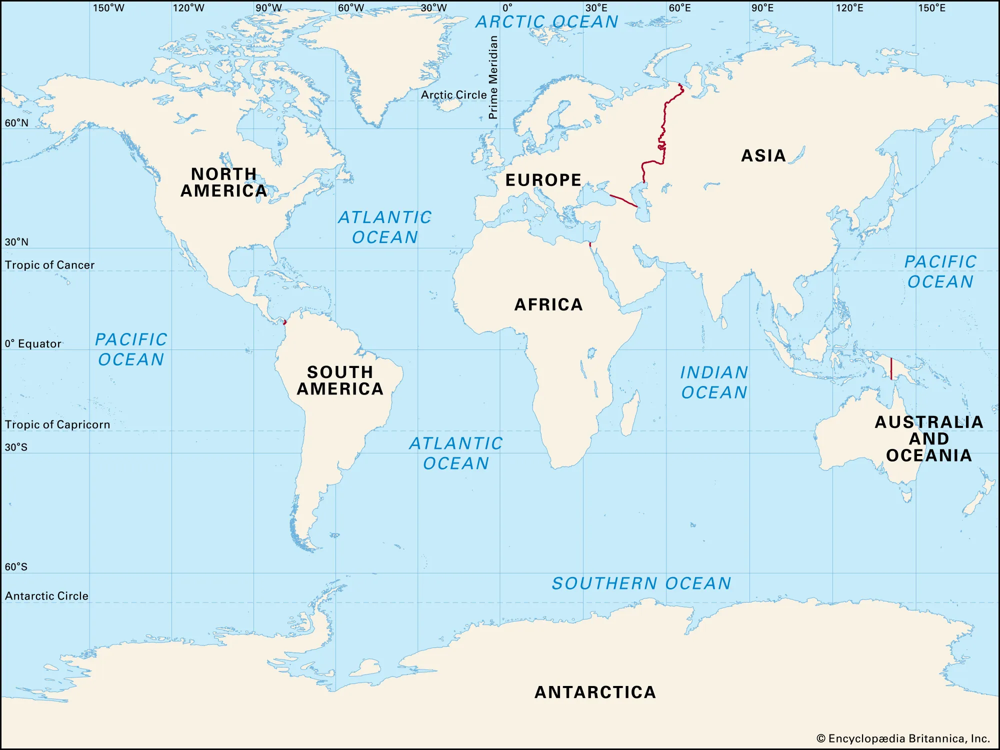

The image above is a reference to contextualise where the oceans are. 

In [113]:
(data['oceans']).value_counts()

oceans
Atlantic Ocean    15271
Pacific Ocean      5744
Indian Ocean        643
Arctic Ocean        310
Southern Ocean       27
Name: count, dtype: int64

Research has been performed in all 5 oceans of the world, but there is a clear disparity. We will investigate this closer by calculating percentages below. 

In [114]:
oceans = ['Atlantic Ocean', 'Pacific Ocean', 'Indian Ocean', 'Arctic Ocean', 'Southern Ocean']

# creating a for loop to go through each ocean and calculate the percentage
for ocean in oceans:
    percentage = np.sum(data['oceans'] == ocean) / len(data) * 100
    print(f'{percentage:.2f}% of microplastic pollution data was collected in the {ocean}')

68.58% of microplastic pollution data was collected in the Atlantic Ocean
25.80% of microplastic pollution data was collected in the Pacific Ocean
2.89% of microplastic pollution data was collected in the Indian Ocean
1.39% of microplastic pollution data was collected in the Arctic Ocean
0.12% of microplastic pollution data was collected in the Southern Ocean


Most of the research (~94%) into microplastic pollution has been collected in two oceans; ~69% in the Atlantic Ocean, followed by ~26% in the Pacific Ocean. This disparity suggests a potential geographical bias in microplastic pollution research, with the Atlantic and Pacific Oceans being prioritized for study. While these regions are critical due to their size and role in global oceanic systems, the limited focus on the Indian Ocean (~3%), Arctic Ocean (~1%), and Southern Ocean (<1%) indicates potential gaps in understanding the global distribution and impact of microplastics. These underrepresented regions, particularly the Arctic and Southern Oceans, may also be vulnerable to microplastic pollution due to their unique ecosystems and limited human monitoring, emphasizing the need for more balanced research efforts.

In [115]:
ocean_stats = measurements.groupby('oceans')['measurement'].describe()
ocean_stats

# using the 'measurements' dataframe instead of our 'data' dataframe because we delt with the missing measurement values

,count,mean,std,min,25%,50%,75%,max
oceans,,,,,,,,
Arctic Ocean,310.0,7.547905,29.438883,0.0,0.00025,0.064958,1.000000,375.000000
Atlantic Ocean,10100.0,186.781137,2599.440023,0.0,0.00000,0.009000,0.088552,110480.000000
Indian Ocean,637.0,175.226529,569.106237,0.0,0.01047,0.121639,18.000000,4320.000000
Pacific Ocean,5375.0,829.972113,14056.065678,0.0,0.00000,0.010800,0.647962,800000.000000
Southern Ocean,27.0,0.050813,0.132226,0.0,0.00000,0.008000,0.012500,0.499663


The Pacific Ocean has the highest mean measurement of microplastics (~830 units), followed by the Atlantic (~187 units) and Indian Oceans (~175 units). The Pacific Ocean also shows the largest variability in measurements of microplastics, as indicated by its high standard deviation (~14,056) and maximum recorded value (800,000 units). This suggests significant pollution hotspots in the Pacific, likely driven by phenomena such as the Great Pacific Garbage Patch (REF??). While research in the Arctic and Southern Oceans reveal much lower mean values, ~8 units and ~0.05 units respectively, this could be attributed to the limited sampling in these oceans. It therefore raises questions about whether these numbers truly reflect their pollution levels, and emphasises the need for more research to take place. The Southern Ocean has consistently low values across all metrics, likely due to a combination of its remote location and limited research focus.

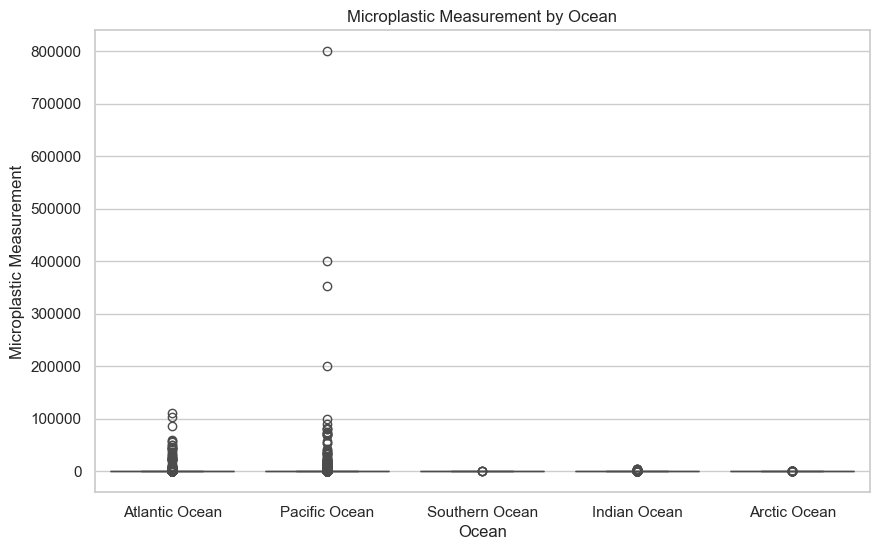

In [116]:
sns.set_theme(style="whitegrid")
plt.figure(figsize=(10, 6))
sns.boxplot(data=data, x='oceans', y='measurement')
plt.title('Microplastic Measurement by Ocean')
plt.xlabel('Ocean')
plt.ylabel('Microplastic Measurement')
plt.show()

800,000 units was flagged by us as an outlier, but the data source checked....

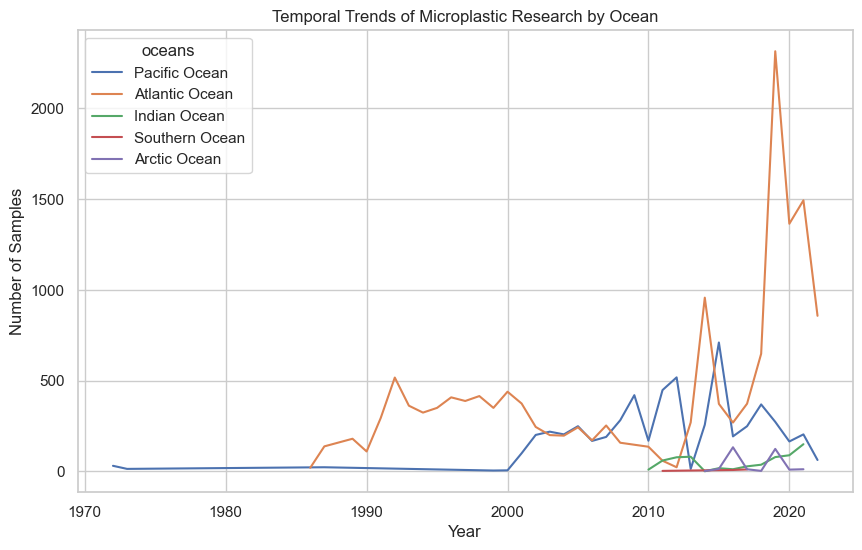

In [117]:
ocean_years = data.groupby(['year', 'oceans']).size().reset_index(name='count')

plt.figure(figsize=(10, 6))
sns.lineplot(data=ocean_years, x='year', y='count', hue='oceans')
plt.title('Temporal Trends of Microplastic Research by Ocean')
plt.xlabel('Year')
plt.ylabel('Number of Samples')
plt.show()

According to the data, microplastic sampling began in the 1970s, with samples collected from the Pacific Ocean. The Atlantic Ocean was the next to be sampled in the 1980s. This information is consistent with the high number of samples for both the Pacific and Atlantic Oceans. It wasn't until the 2010s that samples were collected from the Indian, Southern and Arctic Oceans. This may explain why there are much fewer samples collected in these areas, as research began 30-40 years later. The highest number of samples collected in a single year was 2019 for the Atlantic Ocean; on the graph above this can be seen as a massive peak. Research into marine microplastic pollution has taken off since the 2010s, potentially due to more concern over the environment and climate change. 

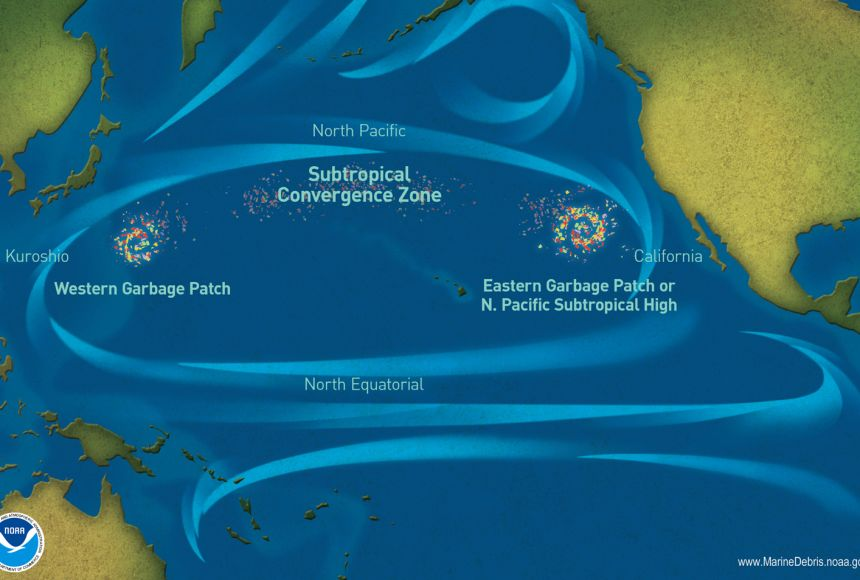

Image from https://education.nationalgeographic.org/resource/great-pacific-garbage-patch/. 

The Great Pacific Garbage Patch is a massive area in the Pacific Ocean, largely made up of marine debris and plastic waste that is carried by ocean currents. It consists of two main regions, the Western and Eastern Garbage Patches, located between Hawaii and California. The patch is primarily formed by plastics that have broken down into smaller pieces, creating a dense accumulation of microplastics which cause the water to look cloudy. These plastics pose serious threats to marine life, from ingestion by marine creatures to entanglement and disruption of ecosystems. With plastic waste being continually dumped into the ocean, the patch is constantly growing, which emphasises the need for global efforts to tackle ocean pollution. Oceanographers recently discovered that about [70% of marine debris](https://education.nationalgeographic.org/resource/great-pacific-garbage-patch/) sinks to the bottom of the ocean, making the vortexs' area nearly impossible to measure. In addition to this, current microplastic sampling techniques mainly collect samples from the surface of the water/top of the water column. We therefore don't have an accurate picture of the extent and magnitude of microplastic pollution. However, this example of a plastic hotspot shaped by ocean currents reveals the importance of studying the effect of ocean currents, and the potential it has to map the pathways of plastic pollution.

# Temporal Exploration

blah blah...

**Hypothesis:**

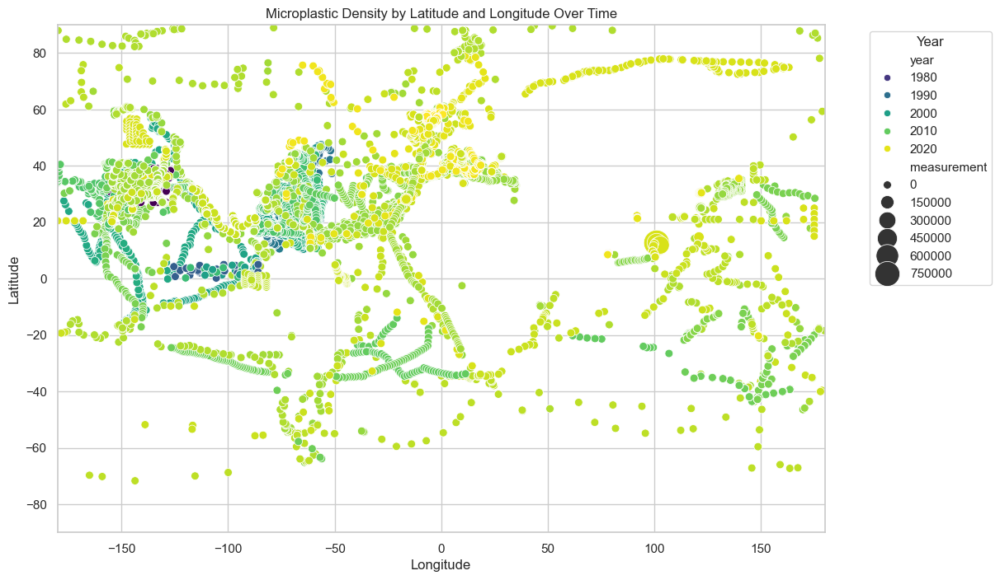

In [118]:
# temporal analysis

sns.set_theme(style="whitegrid")
plt.figure(figsize=(12, 8))

sns.scatterplot(data=data, x='longitude', y='latitude', hue='year', size='measurement', palette='viridis', sizes=(50, 500))
plt.xlim(-180, 180)
plt.ylim(-90, 90)
plt.title('Microplastic Density by Latitude and Longitude Over Time')
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.legend(title='Year', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

# Seasonal Exploration

blah blah...

**Hypothesis:**

C:\Users\Asha\AppData\Local\Temp\ipykernel_17436\3890092578.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




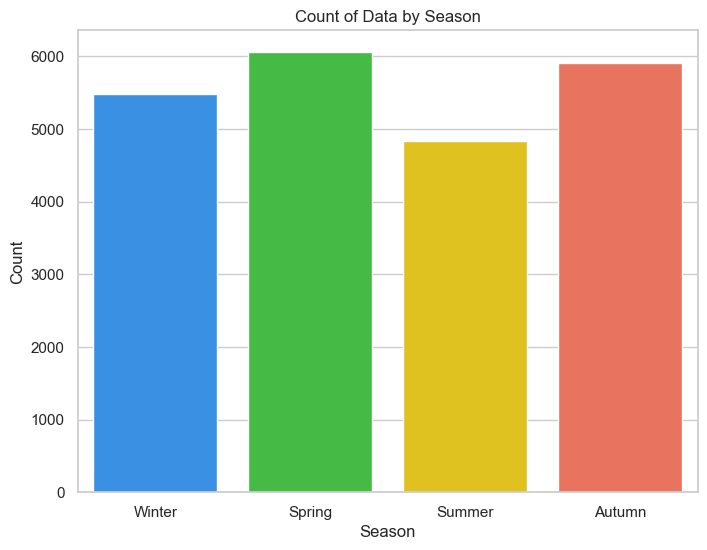

In [119]:
# looking at the distribution of data across the seasons

plt.figure(figsize=(8, 6))
sns.countplot(data=data, x='season', order=['Winter', 'Spring', 'Summer', 'Autumn'], 
              palette=['#1E90FF', '#32CD32', '#FFD700', '#FF6347'])
plt.title('Count of Data by Season')
plt.xlabel('Season')
plt.ylabel('Count')
plt.show()

There is a very consistent distribution of samples across the seasons. This even spread of data allows us to do seasonal analysis.

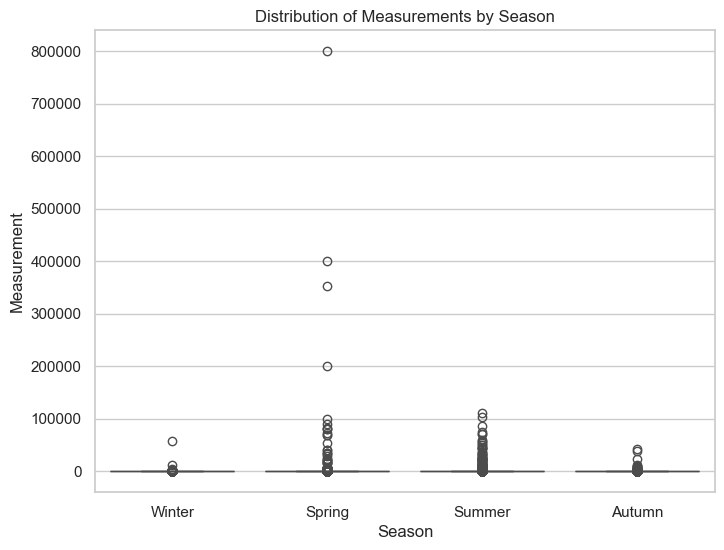

In [120]:
plt.figure(figsize=(8, 6))
sns.boxplot(data=data, x='season', y='measurement', order=['Winter', 'Spring', 'Summer', 'Autumn'])
plt.title('Distribution of Measurements by Season')
plt.xlabel('Season')
plt.ylabel('Measurement')
plt.show()

Spring has the highest distribution of measurements of microplastics, and it has the highest recorded value. For Winter, Summer, and Autumn, the data points stay roughly within 100,000 units of microplastics - there is less variation. Spring did have the highest number of samples, but not by a significant amount. Therefore, there may be another factor influencing this larger variation in Springs results, such as the locations where the sampling occurred. Further analysis would have to be performed to investigate this. 

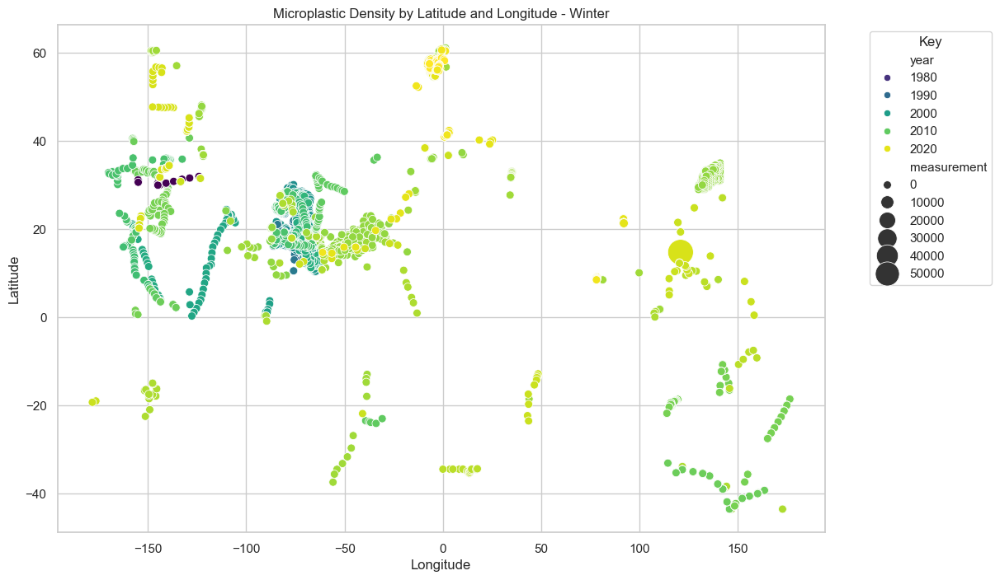

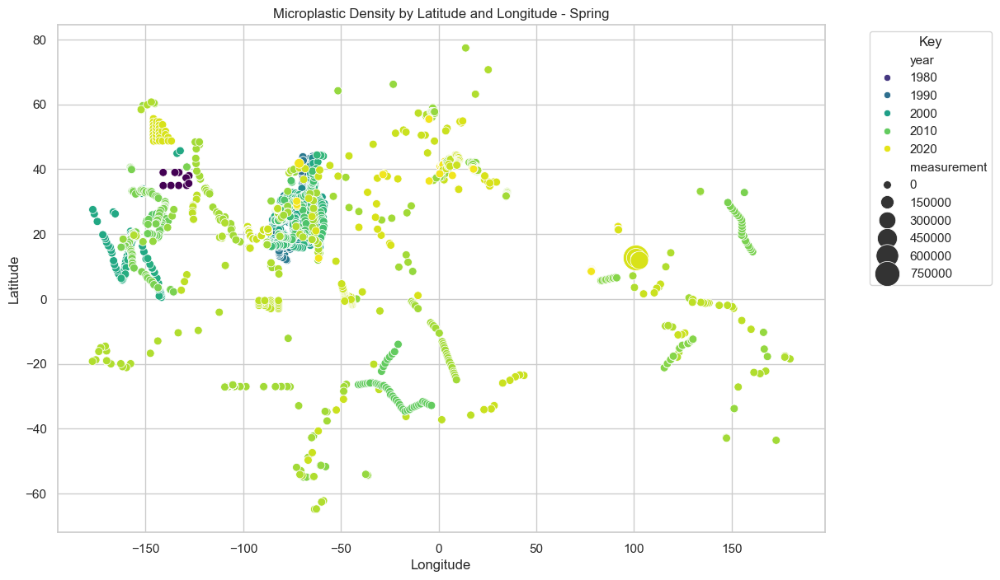

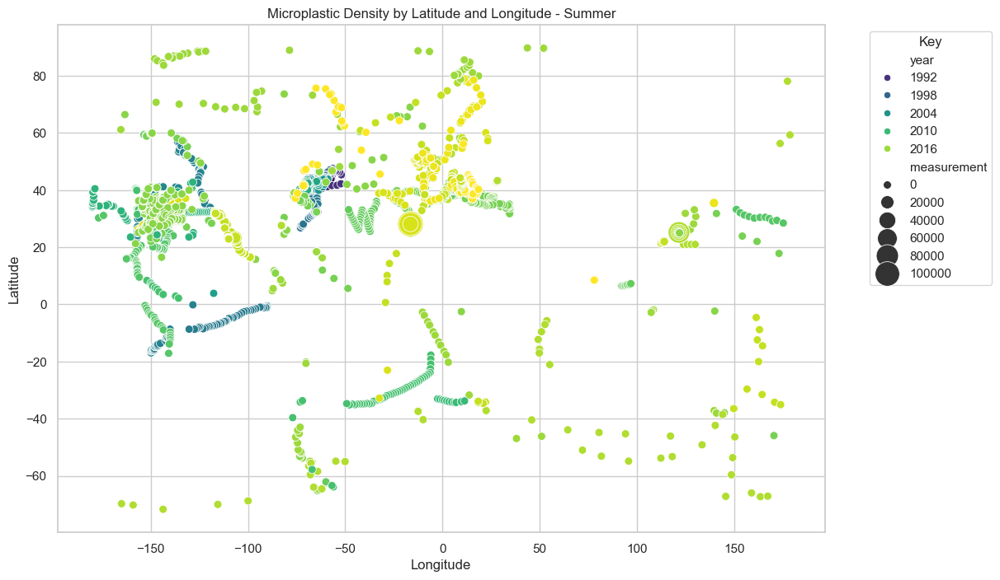

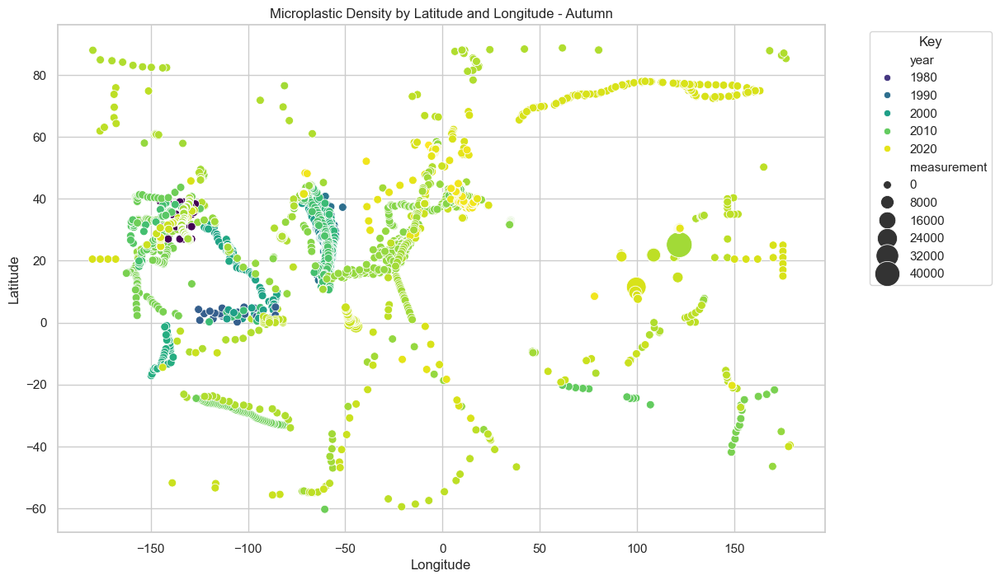

In [121]:
# mapping the measurement and year data for the seasons

seasons = ['Winter', 'Spring', 'Summer', 'Autumn']

for season in seasons:
    season_data = data[data['season'] == season]

    plt.figure(figsize=(12, 8))
    
    sns.scatterplot(data=season_data, x='longitude', y='latitude', hue='year', size='measurement', 
                    palette='viridis', sizes=(50, 500))

    plt.title(f'Microplastic Density by Latitude and Longitude - {season}')
    plt.ylabel('Latitude')
    plt.xlabel('Longitude')
    plt.legend(title='Key', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()

interpretation...

# Sampling Methods Exploration

blah blah...

**Hypothesis:**

In [122]:
(data['sampling method']).value_counts()

sampling method
Neuston net                  10390
Hand picking                  5835
Manta net                     2731
Grab sample                   1389
PVC cylinder                   370
Intake seawater pump           284
Van Dorn sampler               181
Metal spoon                    135
Plankton net                   100
Megacorer                       90
Metal scoop                     89
plankton net                    72
shovel                          72
Stainless steel bucket          69
Trowel                          60
Aluminum bucket                 57
Stainless steel spoon           50
CTD rosette sampler             48
Ekman dredge                    45
Remotely operated vehicle       40
AVANI net                       36
Petite Ponar benthic grab       36
Sediment grab sampler           26
stainless-steel sampler         23
Day grab                        17
Shipek grab sampler              9
Van Veen grab sampler            7
Surface water intake             5
Name

This section examines the four most widely used sampling methods globally. The rationale for this selection is based on the assumption that their widespread adoption suggests a proven reliability and adaptability across a diverse range of conditions.

Each sampling method works differently, as follows:

#### Neuston Net

The most widely used sampling method within the database. It consist of fine mesh net that samples the top layer of the ocean.

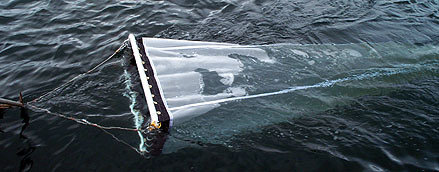

#### Hand Picking 

It is a direct, precise method, ideal for specific target samples. This type of sampling often occurrs in shorelines and beaches. The control for handpicking is adding data every 10 minutes. [Find out more here](https://www.ncei.noaa.gov/access/metadata/landing-page/bin/iso?id=gov.noaa.nodc:0259486). 

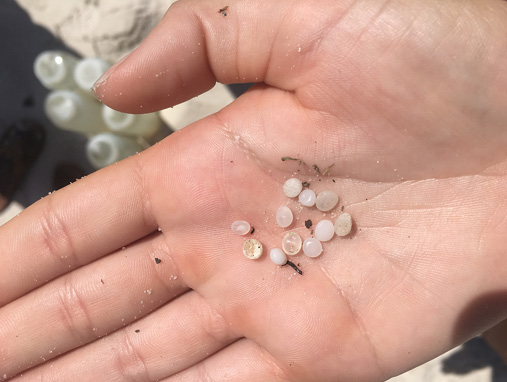

#### Grab Sample 

It is a robust method for collecting sediment or water samples from specific depths or environments, providing localised and detailed data.

#### Manta net 

Similar to the first methods (Neuston Net) it is widely regarded as an effective tool for sampling surface water microplastics. It samples the first 15–25 cm of the water surface. 

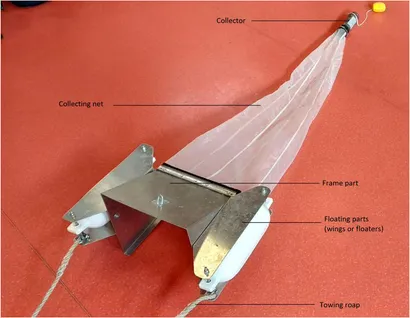

In [123]:
# making new dataframes for the sampling methods with over 1,000 samples
neuston_net = data[data['sampling method'] == 'Neuston net']
hand_picking = data[data['sampling method'] == 'Hand picking']
manta_net = data[data['sampling method'] == 'Manta net']
grab_sample = data[data['sampling method'] == 'Grab sample']

In [124]:
# descriptive stats for the sampling methods
grouped_stats = data.groupby('sampling method')['measurement'].describe()
grouped_stats

,count,mean,std,min,25%,50%,75%,max
sampling method,,,,,,,,
AVANI net,36.0,0.117038,0.279832,0.005113,0.019015,0.062537,0.111311,1.713479
Aluminum bucket,57.0,2089.859649,1341.990835,703.000000,1083.000000,1710.000000,2635.333333,7650.333333
CTD rosette sampler,48.0,46.500000,62.137117,0.000000,21.000000,21.000000,63.000000,375.000000
Day grab,17.0,30.658824,18.790791,2.400000,15.200000,30.600000,40.000000,77.000000
Ekman dredge,45.0,115.000000,60.687351,10.000000,70.000000,120.000000,165.000000,255.000000
Grab sample,1389.0,0.012778,0.027354,0.000000,0.001000,0.005000,0.012000,0.323000
Hand picking,18.0,0.580247,0.722655,0.000000,0.000000,0.388889,0.861111,2.888889
Intake seawater pump,284.0,13.976388,34.935007,0.000000,0.500000,1.000000,11.000000,349.000000
Manta net,2731.0,1.901485,7.432924,0.000000,0.082548,0.440247,1.603295,324.000000


interpretations...

C:\Users\Asha\AppData\Local\Temp\ipykernel_17436\438646258.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asha\AppData\Local\Temp\ipykernel_17436\438646258.py:6: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\Asha\AppData\Local\Temp\ipykernel_17436\438646258.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-ve

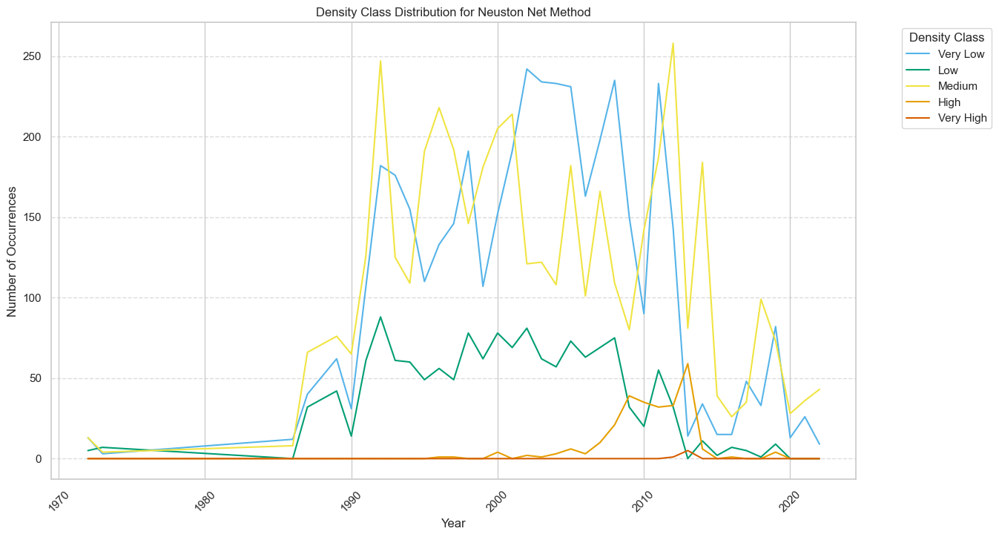

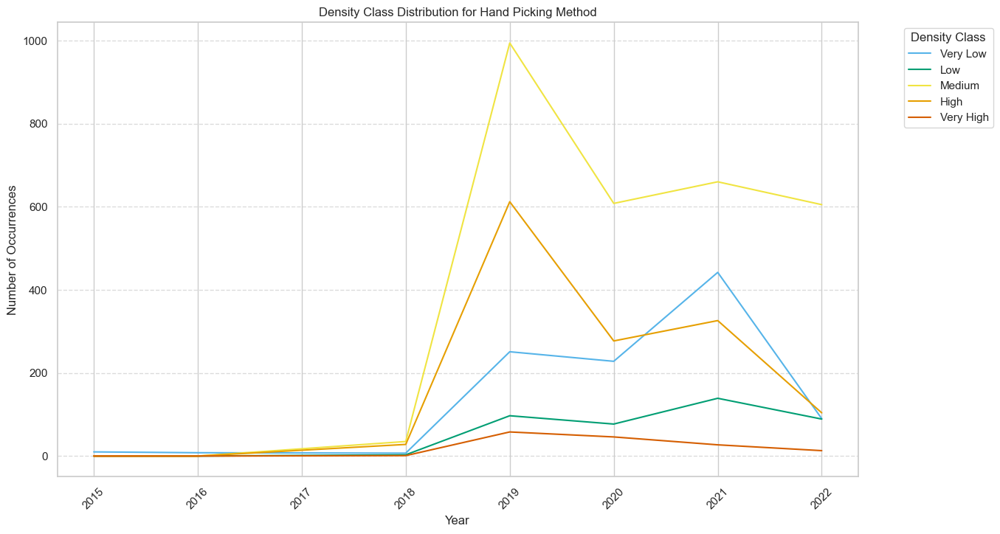

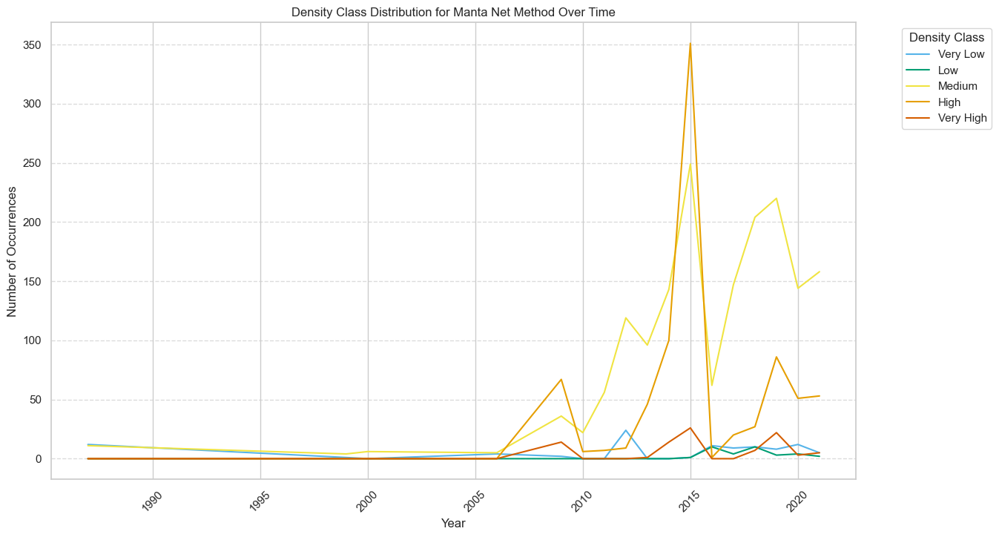

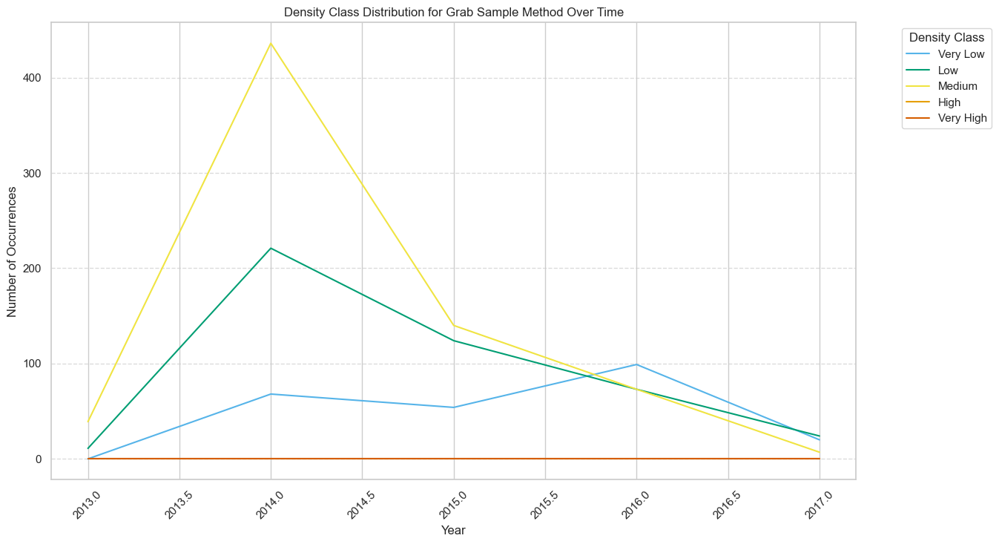

In [125]:
#defining fuction to plot all density class over time for each sampling method 
def plot_density_class_over_time(data, title='Density Class Distribution Over Time'):
   
    density_order = ['Very Low', 'Low', 'Medium', 'High', 'Very High']
    data['density class'] = pd.Categorical(data['density class'], categories=density_order, ordered=True)
    grouped_data = data.groupby(['year', 'density class']).size().reset_index(name='Count')
    pivot_data = grouped_data.pivot(index='year', columns='density class', values='Count').fillna(0)
    pivot_data = pivot_data[density_order]
    custom_colors = {
        'Very Low': '#56B4E9',  
        'Low': '#009E73',       
        'Medium': '#F0E442',    
        'High': '#E69F00',      
        'Very High': '#D55E00'  
    }

    ax = pivot_data.plot(kind='line', figsize=(14, 8), color=[custom_colors[density] for density in density_order])

    plt.title(title)
    plt.xlabel('Year')
    plt.ylabel('Number of Occurrences')
    plt.legend(title='Density Class', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.xticks(rotation=45)  
    ax.grid(axis='y', linestyle='--', alpha=0.7)

plot_density_class_over_time(neuston_net, title='Density Class Distribution for Neuston Net Method')
plot_density_class_over_time(hand_picking, title='Density Class Distribution for Hand Picking Method')
plot_density_class_over_time(manta_net, title= 'Density Class Distribution for Manta Net Method Over Time')
plot_density_class_over_time(grab_sample, title= 'Density Class Distribution for Grab Sample Method Over Time')


**Neuston Net**
- Predominantly Medium and Low Density occurrences, with a significant peak in Medium Density between the 1980s and 2000s.
- High and Very High Densities are minimal, reflecting its limited application for higher density sampling.

**Hand Picking**
- Sharp peaks in Medium and High Densities in 2019–2020. We would have to explore more to find out if the reasons if the peaks are due to higher studies across, or something else. 
- Very high-density occurrences are rare but more noticeable than in Neuston Net.

**Manta Net**
- Moderate usage period from the 1990s to 2020s.
- A notable peak in Medium Density in the mid-2010s.
- High Density occurrences closely follow Medium Density, with fewer Very Low or Low Density instances.

**Grab Sample**

- Dominance of Medium Density occurrences, peaking sharply in 2014.
- Gradual decline in Medium and Low Density samples after the peak.
- Rare or no occurrences of High and Very High Densities.


#### Comparison Across Methods
Medium Density dominates across all methods, reflecting its common occurrence in environmental samples.
Grab Sampling's sharp decline post-2014 suggests a shift away from this method in the last few years. 


# Modelling/Prediction

The published paper from the database states how they have confirmed validity of results etc but the lack of harmonisation across methods, as well as the variance in microplastics (material, size, shape, etc) means that different sampling methods will likely produce different results. We want to examine the significance of the effect of sampling method upon microplastic measurements. Since the data is an aggregate of all research and there is no systematic global approach to microplastics measurements so far, there are significant confounding factors in examining sample method, like location. Whilst it is not a particularly fair test, we can to some extent compare sampling methods so long as the methods are spread across more than one area. So let's map them out to see if this is sufficiently the case...
If sampling method is a strong predictor, then we can comment on the likely bias of the data in a way that could be useful for comparing methods? 
Other predictors we want to investigate are season, year and ocean to whether there are significant seasonal, temporal and spatial effects patterns in microplastic levels. 
As stated, our dependent variable is measurements as this is continuous and numerical. 

In [126]:
import plotly.express as px
import plotly.colors as pc

# Step 1: Filter sampling methods with more than 50 data points
sampling_counts = data['sampling method'].value_counts()  # Count data points per sampling method
methods_over_50 = sampling_counts[sampling_counts > 50].index  # Get methods with more than 50 data points

# Filter the data to include only these sampling methods
filtered_data = data[data['sampling method'].isin(methods_over_50)]

# Step 2: Create a custom colour palette with at least 17 distinct colours
# We can use a combination of Plotly's colour scales for more colours
colours = pc.qualitative.Set2 + pc.qualitative.Set3 + pc.qualitative.Plotly
custom_colours = {method: colours[i % len(colours)] for i, method in enumerate(filtered_data['sampling method'].unique())}

# Step 3: Define more than 17 unique symbols
symbols = ['circle', 'square', 'diamond', 'cross', 'triangle-up', 'star', 'hexagram', 'x', 'pentagon', 'octagon', 
           'arrow-bar-up', 'arrow-bar-down', 'bowtie', 'circle-cross', 'circle-x', 'square-open', 'square-x']
custom_symbols = {method: symbols[i % len(symbols)] for i, method in enumerate(filtered_data['sampling method'].unique())}

# Step 4: Plot the data with custom colours and symbols
fig = px.scatter(
    filtered_data,
    x='longitude',
    y='latitude',
    color='sampling method',
    symbol='sampling method',
    color_discrete_map=custom_colours,  # Apply custom colour map
    symbol_map=custom_symbols,  # Apply custom symbol map
    hover_data=['sampling method'],
    labels={'longitude': 'Longitude', 'latitude': 'Latitude'},
    title='Sampling Methods by Longitude and Latitude (Methods with > 50 Data Points)'
)

# Customize layout
fig.update_layout(
    xaxis=dict(range=[-180, 180]),
    yaxis=dict(range=[-90, 90]),
    width=1200,
    height=800
)

# Show the plot
fig.show()

#sufficient location spread that sampling method is not redundant to location bias ?? maybe ?


From the looks of it, whilst sampling methods are favoured and concentrated in certain areas, there is still a reasonable spread for us to attempt this investigation. 

OLS regression model handles categorical variables natively, assigning them dummy variables so we don't need to manually assign these and can proceed with the regression with our categorical predictors. 

In [127]:
#to aid regression as it doesn't like spaces in names 
data.rename(columns={'sampling method': 'sampling_method'}, inplace=True)

# checking 
print(data.columns)

Index(['oceans', 'regions', 'subregions', 'sampling_method', 'measurement',
       'unit', 'density range', 'density class', 'organization',
       'accession link', 'latitude', 'longitude', 'date', 'x', 'y', 'year',
       'month', 'season'],
      dtype='object')


C:\Users\Asha\AppData\Local\Temp\ipykernel_17436\861229340.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [128]:
import statsmodels.formula.api as smf

# making sure categorical variables are explicitly set
data['oceans'] = data['oceans'].astype('category')
data['sampling_method'] = data['sampling_method'].astype('category')
data['season'] = data['season'].astype('category')


C:\Users\Asha\AppData\Local\Temp\ipykernel_17436\2782071259.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asha\AppData\Local\Temp\ipykernel_17436\2782071259.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Asha\AppData\Local\Temp\ipykernel_17436\2782071259.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-d

### Linear Regression and Categorical Data 

Linear regression analysis is a method used to estimate the value of one variable based on the value of another. The variable being predicted is referred to as the dependent variable, while the variable used for making the prediction is known as the independent variable. 
Source: IBM, 2024. 

Here we have:

**Dependent Variable:** Measurement 

**Independent Variables:** Sampling Method, Year, Location, Season and Ocean. 


In [129]:
model_sampling = smf.ols("measurement ~ sampling_method", data=data).fit()
print(model_sampling.summary())

                            OLS Regression Results                            
Dep. Variable:            measurement   R-squared:                       0.095
Model:                            OLS   Adj. R-squared:                  0.094
Method:                 Least Squares   F-statistic:                     63.96
Date:                Fri, 20 Dec 2024   Prob (F-statistic):               0.00
Time:                        20:09:36   Log-Likelihood:            -1.7094e+05
No. Observations:               16449   AIC:                         3.419e+05
Df Residuals:                   16421   BIC:                         3.422e+05
Df Model:                          27                                         
Covariance Type:            nonrobust                                         
                                                   coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------

In [132]:
#setting neuston net as the baseline because this sampling method has the most measurements data so provides a stable reference point 
model = smf.ols("measurement ~ C(sampling_method, Treatment('Neuston net'))", data=data).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:            measurement   R-squared:                       0.095
Model:                            OLS   Adj. R-squared:                  0.094
Method:                 Least Squares   F-statistic:                     63.96
Date:                Fri, 20 Dec 2024   Prob (F-statistic):               0.00
Time:                        20:28:29   Log-Likelihood:            -1.7094e+05
No. Observations:               16449   AIC:                         3.419e+05
Df Residuals:                   16421   BIC:                         3.422e+05
Df Model:                          27                                         
Covariance Type:            nonrobust                                         
                                                                                coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------

The R-squared value of 0.095 shows that 9.5% of the variance in measurements can be explained by sampling method. A few sampling methods were found to be statistically significant from their p-values, suggesting these are the methods that need to be investigated for bias or extent of difference in accuracy. The coefficients show the comparison to neuston net. 

To inform a standardised global approach to microplastics research, we reccommend controlled experiments that evaluate the accuracy and bias of the following methods, which were found to have statistically significant ( p value < 0.05), albeit minimal, predictive power for measurement values: 
- Aluminum bucket:

    Coefficient: 2089.7426
    p-value = 0.046 (significant at the 5% level)

- Metal scoop:

    Coefficient: 9739.9948
    p-value < 0.001 (highly significant)

- Stainless steel spoon:

    Coefficient: 22074.0
    p-value < 0.001 (highly significant)

- Surface water intake:

    Coefficient: 15830.0
    p-value = 0.000 (highly significant)

- PVC cylinder:

    Coefficient: 1801.2255
    p-value = 0.000 (highly significant)

In [130]:
model_oceans = smf.ols("measurement ~ oceans", data=data).fit()
print(model_oceans.summary())

                            OLS Regression Results                            
Dep. Variable:            measurement   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     5.588
Date:                Fri, 20 Dec 2024   Prob (F-statistic):           0.000172
Time:                        20:10:51   Log-Likelihood:            -1.7175e+05
No. Observations:               16449   AIC:                         3.435e+05
Df Residuals:                   16444   BIC:                         3.436e+05
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
Intercept               

None of the oceans show statistically significant results so there is no evidence that location in regards to ocean strongly influences measurement values and the R-squared value is miniscule anyway. 

Despite oceans not being significant predictors on their own, combining them with sampling methods as an interaction term is justified because the effect of sampling methods likely varies by ocean region, which the interaction term can capture. So let's try this pair of predictors as an interaction to see if we can uncover any more patterns.


In [131]:
# Sampling Method and Ocean Effects (Interaction)
model_so = smf.ols("measurement ~ oceans * sampling_method", data=data).fit()
print(model_so.summary())

                            OLS Regression Results                            
Dep. Variable:            measurement   R-squared:                       0.162
Model:                            OLS   Adj. R-squared:                  0.159
Method:                 Least Squares   F-statistic:                     70.24
Date:                Fri, 20 Dec 2024   Prob (F-statistic):               0.00
Time:                        20:11:59   Log-Likelihood:            -1.7032e+05
No. Observations:               16449   AIC:                         3.407e+05
Df Residuals:                   16403   BIC:                         3.411e+05
Df Model:                          45                                         
Covariance Type:            nonrobust                                         
                                                                            coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------

The R-squared increases from 0.095 (sampling method alone) to 0.16 when including the interaction with oceans. This happens because the relationship between sampling method and measurements isn't the same across all oceans. The interaction term captures region-specific effects of sampling methods, explaining additional variability in the data. While oceans alone are not strong predictors, they did provide context for how sampling methods perform differently in each region. This improved the model's ability to explain the data but also increases complexity, which can lead to overfitting or difficulty in interpretation.


# Interpretation

Given the inherent variability in environmental data, it is common to observe lower R-squared and Adjusted R-squared values, as many uncontrolled factors limit the proportion of variance that can be explained by the model. 

# Evaluation - Limitations

Throughout the analysis and exploration conducted in this notebook, we encountered several challenges and limitations that impacted the depth and reliability of the results. These include issues with the data itself, methodological constraints, and resource limitations. 

The dataset contained numerous inconsistencies and variations that complicated the analysis. Some key variables lacked sufficient data, making it difficult to draw meaningful outcomes. For example, density classifications were not comparable across the dataset. This limited our options to perform other statistical models. 

The exploratory analyses were brief and somewhat simplistic due to time constraints. This limited our ability to fully investigate patterns or uncover deeper insights within the data. Additionally, the sampling methods used came with specific assumptions that were not fully addressed, as studying these in depth would have required more time. 

We initially performed the seasonal analysis without accounting for the fact that seasons differ between hemispheres. This oversight required us to re-run significant portions of the code to correct the issue. The need to backtrack and adjust for this mistake not only impacted the accuracy of our initial findings but also slowed down our ability to explore other models. 

# Future Research

For future research, there are several key areas that could further our understanding and contribute to addressing the growing issue of microplastic pollution. One particular area we wanted to explore if we had more time was the organisations involved in microplastic research and mapping their locations. This could provide insights into cooperative networks and identify regions where future research efforts could be concentrated, particularly in countries or areas most affected by plastic pollution. Building this map would offer a clearer picture of global research efforts, which is critical as the plastic pollution crisis worsens. 

Another vital area for exploration is mapping the pathways of plastic pollution, particularly how plastics travel via ocean currents. Understanding where plastic accumulates and the potential hotspots for microplastic pollution could guide targeted conservation efforts and inform solutions to mitigate the problem. We began research into this within the ocean exploration section, where we identified the 'Great Pacific Garbage Patch' which is a result of ocean currents. However, we did no further exploration or research into the effects of ocean currents, so this would be an ideal avenue to explore. 

Additionally, more research could be done to identify vulnerable marine species by studying their proximity to these pollution hotspots. This would not only help to protect biodiversity, but also aid in creating more effective conservation strategies. Furthermore, future studies could focus on improving the detection and tracking of microplastics in remote or hard-to-reach areas, such as deep-sea ecosystems, to ensure a more comprehensive understanding of how plastic impacts marine life at all levels.

Another area for future research could involve localised studies that focus on specific regions and their unique characteristics. Our exploration of the microplastic dataset was performed on a global scale, which often made it hard to interpret the map visualations. Zooming in on certain regions by performing groupby on the region or subregion column, and then creating visualations from this would be an interesting project development. For example, we noticed that there was a high-density of sampling in areas such as Scotland, which could be zoomed into to investigate the results of that research. Combining this with data on fishing and fish consumption could provide valuable insights into local ecosystems and human health. Similarly, investigating the depletion of marine life near Australia’s coral reefs could offer a clearer understanding of environmental changes and human impact in the region. These region-specific studies could utilise targeted data to uncover patterns that may not be evident on a broader scale.

# Conclusion

# Bibliography 
1. [The NOAA NCEI marine microplastics database](https://www.nature.com/articles/s41597-023-02632-y)
2. [Manta Net: The Golden Method for Sampling Surface Water Microplastics in Aquatic Environments](https://www.frontiersin.org/journals/environmental-science/articles/10.3389/fenvs.2022.811112/full?utm_source=chatgpt.com)
3. [Plastic pellet (nurdle)](https://www.ncei.noaa.gov/access/metadata/landing-page/bin/iso?id=gov.noaa.nodc:0259486)
4. https://towardsdatascience.com/best-practices-for-visualizing-your-cluster-results-20a3baac7426
5.  https://www.ibm.com/think/topics/linear-regression
6. https://wwf.panda.org/wwf_news/?4959466/Ocean-plastic-pollution-to-quadruple-by-2050-pushing-more-areas-to-exceed-ecologically-dangerous-threshold-of-microplastic-concentration 
7. https://marineindustrynews.co.uk/europe-identified-as-a-hotspot-for-marine-microplastics/ 

